In [1]:
import sys
sys.path.append('..')

import torch
import pandas as pd
import numpy as np
from torch.utils.data import DataLoader
from datasets import Dataset
from transformers import AutoModelForSequenceClassification, AutoModelForMaskedLM

from utils import *
from dataset import *
from preprocess import *
from wrapper import *
from models import *
from pipeline import PipelineGED

np.random.seed(1024)

# device = torch.device("cpu")
device = torch.device("cuda:0")
ntf()

In [2]:
MODEL_SIZE = 'base'
MODEL_ARCH = 'macbert'

In [4]:
np.random.seed(297)

train_df = pd.read_csv('../data/data-org/train.csv', sep='\t', index_col='id') #.iloc[np.random.choice(range(45000), size=500)]
test_df = pd.read_csv('../data/data-org/test.csv', sep='\t', index_col='id')

if MODEL_ARCH == 'ernie':
    model_name = 'nghuyong/ernie-gram-zh'
elif MODEL_ARCH == 'macbert':
    model_name = 'hfl/chinese-macbert-base' if MODEL_SIZE == 'base' else 'hfl/chinese-macbert-large'
else:
    print(f'Model {MODEL_ARCH} is not implemented yet.')
ner_model_name = 'uer/roberta-base-finetuned-cluener2020-chinese'


max_length = 64 if MODEL_SIZE == 'base' else 64

test_dataset_config = {
    'model_name':model_name,
    # 'aux_model_name':ner_model_name,
    'maxlength':max_length,
    'train_val_split':-1,
    'test':True, 
    'remove_username':False,
    'remove_punctuation':False, 
    'to_simplified':False, 
    'emoji_to_text':False, 
    'device':device,
    'split_words':True, 
    'cut_all':False, 
}

test = DatasetWithAuxiliaryEmbeddings(df=test_df.reset_index(), **test_dataset_config)
test.tokenize()
test.construct_dataset()

train_dataset_config = {
    'model_name':model_name,
    # 'aux_model_name':ner_model_name,
    'maxlength':max_length,
    'train_val_split':-1,
    'test':False, 
    'remove_username':False,
    'remove_punctuation':False, 
    'to_simplified':False, 
    'emoji_to_text':False, 
    'device':device,
    'split_words':True, 
    'cut_all':False, 
}

train = DatasetWithAuxiliaryEmbeddings(df=train_df.reset_index(), **train_dataset_config)
train.tokenize()
train.construct_dataset()

ntf()

Building prefix dict from the default dictionary ...
Loading model from cache C:\Users\holaj\AppData\Local\Temp\jieba.cache
Loading model cost 0.648 seconds.
Prefix dict has been built successfully.
d:\Develop\chinese-grammar-error-detection\notebooks\..\dataset.py:122: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  indexed_value = torch.tensor(value[index]).squeeze()
d:\Develop\chinese-grammar-error-detection\notebooks\..\dataset.py:122: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  indexed_value = torch.tensor(value[index]).squeeze()


In [5]:
checkpoints = [
    # '../finetuned_models/ner_run_aug_74866/fold0/checkpoint-4065/pytorch_model.bin', 
    # '../finetuned_models/ner_run_aug_74866/fold1/checkpoint-12195/pytorch_model.bin', 
    # '../finetuned_models/ner_run_aug_74866/fold2/checkpoint-12195/pytorch_model.bin', 
    # '../finetuned_models/ner_run_aug_74866/fold3/checkpoint-8130/pytorch_model.bin', 
    # '../finetuned_models/ner_run_aug_74866/fold4/checkpoint-4065/pytorch_model.bin', 
    # '../finetuned_models/ner_run_aug_74866/fold5/checkpoint-8130/pytorch_model.bin', 
    # '../finetuned_models/ner_run_aug_74866/fold6/checkpoint-12195/pytorch_model.bin', 
    # '../finetuned_models/ner_run_aug_74866/fold7/checkpoint-8130/pytorch_model.bin', 
    '../finetuned_models/ner_run_aug_74866/fold8/checkpoint-4065/pytorch_model.bin', 
    # '../finetuned_models/ner_run_aug_74866/fold9/checkpoint-12195/pytorch_model.bin'
]
# checkpoints = [
#     '../finetuned_models/ner_run_aug_single/fold9/checkpoint-5014/pytorch_model.bin',
#     '../finetuned_models/ner_run_aug_single/fold9/checkpoint-7521/pytorch_model.bin',
# ]
if MODEL_ARCH == 'macbert':
    checkpoints = [f'../finetuned_models/balanced_trial/fold{i}/checkpoint-2865/pytorch_model.bin' for i in range(10)] 
elif MODEL_ARCH == 'ernie':
    checkpoints = [f'../finetuned_models/balanced_trial_ernie_gram/fold{i}/checkpoint-1910/pytorch_model.bin' for i in range(10)] 
else:
    print(f'Model {MODEL_ARCH} is not implemented yet.')

data_configs = {
    'model_name':model_name,
    'maxlength':max_length,
    'train_val_split':-1,
    'test':True, 
    'remove_username':False,
    'remove_punctuation':False, 
    'to_simplified':False, 
    'emoji_to_text':False, 
    'split_words':False, 
    'cut_all':False, 
}
clf = PipelineGED(
    model_name=model_name, 
    data_configs=data_configs, 
    single_layer_cls=True, 
    model_architecture='bert_with_clf_head', 
)

def apply_ged_pipeline(texts, majority_vote=False):
    if majority_vote:
        return clf(texts=texts, checkpoints=checkpoints, device=device, output_probabilities=True, display=False, majority_vote=True)
    probs, seq_probs, err_char_lst = clf(texts=texts, checkpoints=checkpoints, device=device, output_probabilities=True, display=False, majority_vote=False)
    return probs, seq_probs, err_char_lst

Some weights of the model checkpoint at hfl/chinese-macbert-base were not used when initializing BertForMaskedLM: ['cls.seq_relationship.weight', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


### Eval on train set

In [6]:
probs, seq_probs, err_char_lst = apply_ged_pipeline(train_df.text.values)
prediction = probs.argmax(1)

d:\Develop\chinese-grammar-error-detection\notebooks\..\dataset.py:122: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  indexed_value = torch.tensor(value[index]).squeeze()
100%|██████████| 2828/2828 [03:28<00:00, 13.54it/s]


In [7]:
data = train_df[['label', 'text']]
data['prediction'] = prediction
data['score'] = probs[:, 1]
data['confidence'] = 1 - 2*np.abs(data.score.values - data.prediction)
data = data[['label', 'prediction', 'score', 'confidence', 'text']]
data['err_chars'] = err_char_lst
print(len(data[data.label != data.prediction]))

with pd.option_context('display.max_rows', None, 'display.max_columns', None, ):
    pd.options.display.max_colwidth = 100
    # display(data[data.label != data.prediction].sort_values(by='score'))
    display(data[data.label != data.prediction])
# data[data.label != data.prediction].to_csv('../case_analysis/aug.csv')
ntf()

5470


,label,prediction,score,confidence,text,err_chars
id,,,,,,
7,0,1,0.798220,0.596440,苏明娟实现了从农家女孩到共青团安徽省委副书记的“逆袭”，这让我们看到：扶贫救困不能只顾解决眼前问题，更要立足长远培养脱贫能力。,"[[CLS], 培, 力, 。]"
9,1,0,0.470234,0.059532,下午三点整，参加成立典礼的群众全部到齐了。,[]
14,0,1,0.874230,0.748460,省科学技术奖的推荐、评审和授奖，坚持公开、公平、公正的原则，依法管理，求真务实，注重实效，严格评审标准，不受任何组织和个人的干涉，坚决防止弄虚作假。,"[[CLS], 省, 的, 推, 授, 奖, ，, ，, 效, ，, 严, 格, 评, 标, 准, ，, 不, 受, 任, 何, 的, 干]"
17,0,1,0.799638,0.599276,12月9日下午，江西省考古研究所研究室主任张文江在景德镇市唐代南窑遗址考古成果发布会上宣布，在乐平市接渡镇发现了我国迄今最长的唐代龙窑遗迹。,"[[CLS], 市, 布, 镇, 发, 现, 了, 我, 国, 迄, 今, 最, 长, 的]"
18,0,1,0.923006,0.846013,道德本是维系群体人际关系的准则，它是一种逐渐形成并不断演化、不断微调以适应不断变化着的生存环境的产物，是一种非人为设计的长久习俗。,"[[CLS], 道, 德, ，, 种, 形, 成, 并, 不, 演, 化, 不, 断, 微, 调, 以, 适, 应, 不, 着, 的, 生, 存, 境, 的, 产, 物, ，, 是, 一, 种..."
20,1,0,0.120427,0.759145,2009年末，奥巴马总统决定再向阿富汗增兵10万，在塔利班已然再成气候的今日阿富汗，区区十万兵力能否扭转乾坤，颇为令人怀疑。,[]
21,0,1,0.939440,0.878880,修改后的《中华人民共和国个人所得税法》于9月1日正式实行。新《中华人民共和国个人所得税法》实施后，全国约6000万的工薪阶层纳税人成为最主要的受益群体。,"[[CLS], 。, 新, 后, ，, 全, 国, 约, 6, 0, 0, 0, 万, 的, 工, 薪, 阶, 层, 纳]"
27,0,1,0.666900,0.333800,保护野生动植物就是保护人类赖以生存的生态环境，国家应加快建立自然保护地管理体系，让重要的自然生态系统得到有效保护，促进人与自然和谐共生。,"[[CLS], 促, 进, 与, 自, 然]"
106,0,1,0.929244,0.858489,由此可见，文化上真正的高峰是可能被云雾遮盖数百年之久的。大家只喜欢在一座座土坡前爬上爬下，狂呼乱喊，却完全没有注意那一脉与天相连的隐隐青褐色，很可能是一座惊世高峰。,"[[CLS], 由, 此, 文, 。, 大, 家, 只, 喜, 欢, 在, 一, 座, 座, 土, 坡, 前, 爬, 上, 下, ，, 狂, 呼, 喊, ，, 却, 完, 全, 没, 注, 意..."


In [13]:
len(data.err_chars.iloc[0])

33

In [14]:
# Get the difficult but correctly classified examples and use for further finetuning

from collections import OrderedDict
import json

SAVE = False

if SAVE:
    data[data.label != data.prediction].to_csv('../case_analysis/ensemble_pred_error.csv', encoding='utf-8')
    data.to_csv('../case_analysis/ensemble_pred.csv', encoding='utf-8')

difficult_correct_examples_idx = (data.prediction == data.label) & \
    (data.err_chars.map(lambda l: '[CLS]' not in l) | (data.err_chars.map(lambda l: len(l.split() if isinstance(l, str) else l)) < data.text.map(len)//3))
difficult_correct_examples = data[difficult_correct_examples_idx]
full_display(difficult_correct_examples)

,label,prediction,score,confidence,text,err_chars
id,,,,,,
11,0,0,0.054492,0.891015,我们正在走进五彩缤纷、朝气蓬勃的青春花季。,[]
15,0,0,0.008957,0.982086,如何体会企业文化的深刻内涵，认识用伊秀文化提升企业竞争力的重要性，是摆在每一位中国企业家面前的重要课题。,[]
19,0,0,0.016714,0.966573,成立陆军领导机构、组建战略支援部队，是中国军队现代化建设的一个重要里程碑，彰显了一个走向复兴的大国实现强军梦的决心。,[]
29,0,0,0.048093,0.903815,救灾队伍在余震不断、交通断绝、通信不畅的恶劣环境下坚韧前行，一条条生命因为他们的到来重获生机。,[]
33,0,0,0.007340,0.985319,深圳人以“心容天下，敢为人先”的精神，创造了一个又一个奇迹。,[]
34,0,0,0.006229,0.987543,通过参加志愿者活动，许多学生都感受到了奉献的快乐。,[]
35,0,0,0.033937,0.932126,其实，日落的景象和日出同样壮观、绮丽，而且神秘、迷人。,[]
38,0,0,0.095202,0.809597,江苏省出台了校园足球行动计划纲要，创建一批校园足球特色学校和特色县。,[]
44,0,0,0.119627,0.760747,许多青年人热心于世界科技的发展，他们有志成为世界知名学者，他们对国际的重大问题给予极大的关注。,[]


In [ ]:

if SAVE:
    data[difficult_correct_examples_idx].to_csv('../case_analysis/ensemble_difficult_correct.csv')

soft_label_df = train_df.reset_index(inplace=False)[difficult_correct_examples_idx].copy(deep=True)
soft_label_dict = soft_label_df.to_dict(into=OrderedDict, orient='index')
for i, b in difficult_correct_examples_idx.items():
    if b:
        soft_label_dict[i]['soft_label'] = seq_probs[i].tolist()

if SAVE:
    with open('../data/token-level-finetune/token_train.json', 'w') as f:
        f.write(json.dumps(soft_label_dict))

In [34]:
data[difficult_examples_idx].to_csv('../case_analysis/ensemble_difficult.csv')

In [23]:
prediction, seq_predictions = apply_ged_pipeline(train_df.text.values, majority_vote=False)

data = train_df[['label', 'text']]
data['prediction'] = prediction
data = data[['label', 'prediction', 'text']]
print(len(data[data.label != data.prediction]))
with pd.option_context('display.max_rows', None, 'display.max_columns', None, ):
    pd.options.display.max_colwidth = 100
    # display(data[data.label != data.prediction].sort_values(by='score'))
    display(data[data.label != data.prediction])
# data[data.label != data.prediction].to_csv('../case_analysis/aug.csv')
ntf()

d:\Develop\chinese-grammar-error-detection\notebooks\..\dataset.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  indexed_value = torch.tensor(value[index]).squeeze()


ValueError: too many values to unpack (expected 2)

In [8]:
fp = ((data.label == 0).values * (data.prediction==1).values).sum()
fn = ((data.label == 1).values * (data.prediction==0).values).sum()
tp = ((data.label == 1).values * (data.prediction==1).values).sum()
tn = ((data.label == 0).values * (data.prediction==0).values).sum()

print(fp, fn, tp, tn)

precision = tp / (tp+fp)
recall = tp / (tp+fn)
f1 = 2*precision*recall / (precision+recall)
accuracy = (tp+tn) / (tp+tn+fp+fn)

print(precision, recall, f1, accuracy)

2955 2515 31245 8533
0.9135964912280702 0.9255035545023697 0.9195114773396115 0.8791106789250354


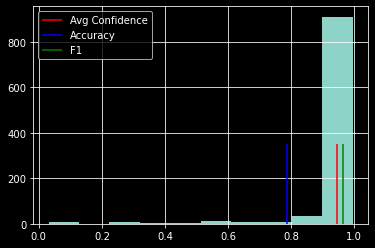

In [ ]:
import matplotlib.pyplot as plt
data.confidence.hist()
plt.vlines(x=data.confidence.mean(), ymin=0, ymax=350, colors='red', label='Avg Confidence')
plt.vlines(x=(tp+tn)/(tp+tn+fp+tn), ymin=0, ymax=350, colors='blue', label='Accuracy')
plt.vlines(x=f1, ymin=0, ymax=350, colors='green', label='F1')
plt.legend()

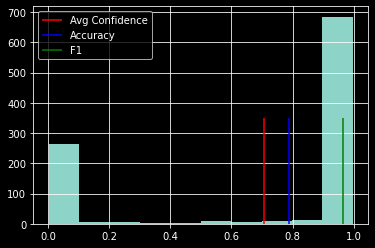

In [ ]:

data['score'].hist()
plt.vlines(x=data.score.mean(), ymin=0, ymax=350, colors='red', label='Avg Confidence')
plt.vlines(x=(tp+tn)/(tp+tn+fp+tn), ymin=0, ymax=350, colors='blue', label='Accuracy')
plt.vlines(x=f1, ymin=0, ymax=350, colors='green', label='F1')
plt.legend()

### Eval on Test Set

In [7]:
prediction = apply_ged_pipeline(test_df.text.values, majority_vote=True)
ntf()

d:\Develop\chinese-grammar-error-detection\notebooks\..\dataset.py:104: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  indexed_value = torch.tensor(value[index]).squeeze()


In [6]:
data = test_df.copy(deep=True)
data['comp'] = pd.read_csv('../submissions/submission-v3-0.75624.csv', delimiter='\t').set_index('id').label

data['prediction'] = prediction[0]
# pred_df = pd.read_csv('../submissions-aug/submission.csv', delimiter='\t')
# pred_df['id'] = range(1, 1+len(pred_df))
# pred_df.set_index('id', inplace=True)
# data['prediction'] = pred_df.label

data = data[['comp', 'prediction', 'text']]
print(len(data[data.comp != data.prediction]))
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(data[data.comp != data.prediction])

400


,comp,prediction,text
id,,,
1,0,1,唐诗宋词是我国浩如烟海的古代文化中一块瑰丽的瑰宝，所以我们要好好珍惜，将它们传承下去。
2,0,1,这次迎新活动举办得非常成功，参加活动的人数超过1000人。
3,0,1,春天到了，山上姹紫嫣红的野花开得灿烂极了。
8,0,1,王小红在这次考试中取得了好成绩，校长亲自为他颁发了奖状。
10,0,1,妹妹总是跟在哥哥的后面，想要哥哥给自己买糖吃。
11,0,1,王磊是个著名的画家，能画出精妙绝伦的佳作。
12,0,1,关于长城，民间一直都有这样的说法“不到长城非好汉”。
18,0,1,我国生产的石油，长期不能自给。
22,0,1,厦门的彩虹沙滩很宽很美，小红很羡慕生活在海滩的人，因为他们出门就可以赶海。


In [10]:
test_probs, test_seq_probs, test_err_char_lst = apply_ged_pipeline(test_df.text.values)
ntf()

d:\Develop\chinese-grammar-error-detection\notebooks\..\dataset.py:119: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  indexed_value = torch.tensor(value[index]).squeeze()


In [11]:
test_data = test_df.copy(deep=True)
test_data['comp'] = pd.read_csv('../submissions/submission-v3-0.75624.csv', delimiter='\t').set_index('id').label

test_data['prediction'] = test_probs.argmax(1)
test_data['score'] = test_probs[:, 1]
test_data['confidence'] = 1 - 2*np.abs(test_data.score.values - test_data.prediction)

test_data = test_data[['comp', 'prediction',  'score', 'confidence', 'text']]
test_data['error_chars'] = test_err_char_lst
print(len(test_data[test_data.comp != test_data.prediction]))
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    # display(data[data.comp != data.prediction].sort_values(by='confidence'))
    display(test_data[test_data.comp != test_data.prediction])

250


,comp,prediction,score,confidence,text,error_chars
id,,,,,,
13,1,0,0.321116,0.357768,官员和民众都必须遵守法律法规，否则就会受到惩罚。,[]
25,1,0,0.148858,0.702284,电影《流浪地球》一经上映，刘慈欣的同名小说也备受关注，观众认为其气势恢宏、令人震撼。,[]
29,1,0,0.187652,0.624697,湖水倒映在山峰里，显得更绿了。,[]
31,1,0,0.413140,0.173721,我这可都是鲁迅的书。,[]
39,1,0,0.496168,0.007663,外婆家有个非常漂亮的大鱼缸，里面有小丑鱼、乌龟和金鱼等鱼类。,[]
43,1,0,0.496705,0.006591,社会文明发展迅速，群众性文明活动新格局的局面正在我市形成。,[]
44,0,1,0.556489,0.112978,这顿庆功宴，是专门为给公司带来巨大利润的小强所准备的。,"[门, 所, 准]"
53,1,0,0.352579,0.294842,每次路过街口的咖啡店，小徐总会停下脚步看下店里靠墙的角落。,[]
57,1,0,0.311049,0.377901,小莉变得十分沉默寡言，她的家里发生了一些重大变故。,[]


In [11]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    pd.options.display.max_colwidth = 100
    display(test_data)

,comp,prediction,score,confidence,text,error_chars
id,,,,,,
1,0,0,0.129373,0.741254,唐诗宋词是我国浩如烟海的古代文化中一块瑰丽的瑰宝，所以我们要好好珍惜，将它们传承下去。,[]
2,0,0,0.231809,0.536381,这次迎新活动举办得非常成功，参加活动的人数超过1000人。,[]
3,0,0,0.330965,0.338070,春天到了，山上姹紫嫣红的野花开得灿烂极了。,[]
4,1,1,0.927167,0.854335,外公看到小明非常开心，不由分说地把他拉到了书房。,"[[CLS], 外, 公, 看, 到, 小, 明, 非, 常, 开, 心, ，, 不, 由, 分, 说, 地, 把, 他, 拉, 到, 了, 书, 房, 。, [SEP]]"
5,1,1,0.985842,0.971683,今天的解方程太难了，晓军用了整整一个小时左右才做完。,"[[CLS], 今, 天, 的, 解, 方, 程, 太, 难, 了, ，, 晓, 军, 用, 了, 整, 整, 一, 个, 小, 时, 左, 右, 才, 做, 完, 。, [SEP]]"
6,1,1,0.973349,0.946698,我不但学会了弹琴，而且小明也学会了弹琴。,"[[CLS], 我, 不, 但, 学, 会, 了, 弹, 琴, ，, 而, 且, 小, 明, 也, 学, 会, 了, 弹, 琴, 。, [SEP]]"
7,1,1,0.970840,0.941681,胆小者宣扬退缩论，是出于他们的懒惰本质所决定的。,"[[CLS], 胆, 小, 者, 宣, 扬, 退, 缩, 论, ，, 是, 出, 于, 他, 们, 的, 懒, 惰, 本, 质, 所, 决, 定, 的, 。, [SEP]]"
8,0,0,0.367163,0.265675,王小红在这次考试中取得了好成绩，校长亲自为他颁发了奖状。,[]
9,1,1,0.994114,0.988229,在这本书中，描绘了一场盛大的穆斯林葬礼。,"[[CLS], 在, 这, 本, 书, 中, ，, 描, 绘, 了, 一, 场, 盛, 大, 的, 穆, 斯, 林, 葬, 礼, 。, [SEP]]"


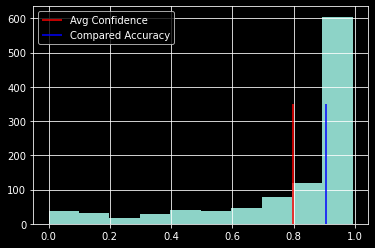

In [124]:
data.confidence.hist()
plt.vlines(x=data.confidence.mean(), ymin=0, ymax=350, colors='red', label='Avg Confidence')
plt.vlines(x=len(data[data.comp == data.prediction]) / len(data), ymin=0, ymax=350, colors='blue', label='Compared Accuracy')
# plt.vlines(x=f1, ymin=0, ymax=350, colors='green', label='F1')
plt.legend()

In [5]:
submissions = data[['prediction']].rename(columns={'prediction':'label'})
submissions['id'] = range(1, 1+len(submissions))
submissions = submissions[['id', 'label']]
submissions.to_csv('../submissions-aug/submission-da.csv', index=False, sep='\t')

# Loss

In [9]:
from torch.nn.functional import cross_entropy

def forward_pass_with_label(batch, focal_loss=True):
    # Place all input tensors on the same device as the model
    inputs = {k:v.to(device) for k,v in batch.items()}

    with torch.no_grad():
        output = model(**inputs)
        pred_label = torch.argmax(output['logits'], axis=-1)
        if focal_loss:
            loss = binary_focal_loss(output['logits'], batch["labels"].to(device), alpha=0.3, gamma=0.8, sum=False)
        else:
            loss = cross_entropy(output['logits'], batch["labels"].to(device), reduction="none")
    # Place outputs on CPU for compatibility with other dataset columns
    return {"loss": loss.cpu().numpy(),
            "predicted_label": pred_label.cpu().numpy()}

In [5]:
# model = BertWithNER(bert_model=model_name, ner_model=ner_model_name)
model = AutoModelWithNER(model=model_name, ner_model=ner_model_name)
state_dict = torch.load(checkpoints[0], map_location=device)
# for key in list(state_dict.keys()):
#     state_dict[key.replace('bert', 'base_model')] = state_dict.pop(key)
model.load_state_dict(state_dict)
model.cuda()

Some weights of the model checkpoint at hfl/chinese-macbert-base were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.bias', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of the model checkpoint at uer/roberta-base-finetuned-cluener2020-chinese were not used when initializi

AutoModelWithNER(
  (base_model): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(21128, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0): BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_af

In [10]:
train.dataset.set_format('torch', columns=['input_ids', 'attention_mask', 'auxiliary_input_ids', 'labels'])
eval_outputs = train.dataset['val'].map(forward_pass_with_label, batched=True, batch_size=16)

  0%|          | 0/283 [00:00<?, ?ba/s]

In [13]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display()

,label,text
id,,
23495-1,1,海南“国际旅游岛”项目是我国由官方独立建造、独立规划、独立投资、独立管理、独立收支的特大型海...
39138,1,央视“成语大会”栏目将国学娱乐化，有利于更多人研究和了解国学。
20777,1,随着反腐力度的进一步加大，新的反腐形势也在出现，有的甚至更加隐秘。反腐是一场持久的战争，它的...
30283,1,“汕优63”杂交稻近几年的年种植面积都超过1亿亩，平均亩产稳定在约500千克左右，不仅产量高...
34053,1,通过这几年的努力，使中国的水面舰艇研制水平和研制能力已经进入世界先进行列，这为中国海军执行远...
41533,1,在此次重庆市青少年科技创新大赛中，同学们常围在一起相互鼓劲并认真总结得失，赢得的远远不只是比...
15549,1,价格改革涉及利益复杂，不仅要坚持改革的方向，积极推进，而且要对方案认真周密研究部署。
42976,1,南通老百姓和海内外游客在狼山不仅可以感受到江海神韵，还可以感受到民族文化的永恒魅力之所在。
11432,1,据美国务院发言人维多利亚·纽兰9日在例行新闻发布会上表示，希望中国发挥影响力，采取措施帮助阻...
